## 0- Objectif du notebook

Notebook de découverte/exploration de la librairie folium

##  1- Chargement des librairies et du jeu de données

In [1]:
import pandas as pd
import numpy as np
import folium
import geoplot as gplt
import geopandas as gpd
import geoplot.crs as gcrs

import warnings
warnings.filterwarnings('ignore')

C:\ProgramData\Anaconda3\lib\site-packages\geopandas\_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
df = pd.read_csv('Fires_filter.csv', index_col = 'OBJECTID')
df.DISCOVERY_DATE = pd.to_datetime(df.DISCOVERY_DATE)
df.CONT_DATE = pd.to_datetime(df.CONT_DATE)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1880465 entries, 1 to 1880465
Data columns (total 18 columns):
 #   Column            Dtype         
---  ------            -----         
 0   FIRE_NAME         object        
 1   FIRE_YEAR         int64         
 2   DISCOVERY_DATE    datetime64[ns]
 3   DISCOVERY_DOY     int64         
 4   DISCOVERY_TIME    float64       
 5   STAT_CAUSE_CODE   float64       
 6   STAT_CAUSE_DESCR  object        
 7   CONT_DATE         datetime64[ns]
 8   CONT_DOY          float64       
 9   CONT_TIME         float64       
 10  FIRE_SIZE         float64       
 11  FIRE_SIZE_CLASS   object        
 12  LATITUDE          float64       
 13  LONGITUDE         float64       
 14  STATE             object        
 15  COUNTY            object        
 16  FIPS_CODE         float64       
 17  FIPS_NAME         object        
dtypes: datetime64[ns](2), float64(8), int64(2), object(6)
memory usage: 272.6+ MB


In [3]:
df.FIRE_SIZE.describe().apply(lambda x: format(x, 'f'))

count    1880465.000000
mean          74.520158
std         2497.598180
min            0.000010
25%            0.100000
50%            1.000000
75%            3.300000
max       606945.000000
Name: FIRE_SIZE, dtype: object

###  2- Surfaces brûlées en 2015 % état pour feux < 3 acres - Préparation des données

Définition d'un dictionnaire qui à un code US sur 2 lettres associe un ID numérique unique de 1 à 52

In [4]:
usa = gpd.read_file("../maps/cb_2020_us_state_20m.shp")
usa.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,47,01325873,0400000US47,47,TN,Tennessee,00,106791646253,2322913374,"POLYGON ((-90.30070 35.02879, -90.26530 35.040..."
1,27,00662849,0400000US27,27,MN,Minnesota,00,206232157570,18949864226,"POLYGON ((-97.22904 49.00069, -96.93096 48.999..."
2,17,01779784,0400000US17,17,IL,Illinois,00,143778461053,6216594318,"POLYGON ((-91.50626 40.20016, -91.49696 40.248..."
3,30,00767982,0400000US30,30,MT,Montana,00,376973673895,3866689601,"POLYGON ((-116.04919 49.00091, -115.50102 49.0..."
4,11,01702382,0400000US11,11,DC,District of Columbia,00,158316124,18709762,"POLYGON ((-77.11976 38.93434, -77.04102 38.995..."


In [5]:
states_dict = {i:j for i, j in zip(usa[['GEOID','STUSPS']].iloc[:,1],usa[['GEOID','STUSPS']].iloc[:,0])}

In [6]:
states_name_dict = {i:j for i, j in zip(usa[['GEOID','NAME']].iloc[:,0],usa[['GEOID','NAME']].iloc[:,1])}

In [7]:
states_name_dict

{'47': 'Tennessee',
 '27': 'Minnesota',
 '17': 'Illinois',
 '30': 'Montana',
 '11': 'District of Columbia',
 '06': 'California',
 '21': 'Kentucky',
 '10': 'Delaware',
 '48': 'Texas',
 '55': 'Wisconsin',
 '29': 'Missouri',
 '36': 'New York',
 '19': 'Iowa',
 '41': 'Oregon',
 '51': 'Virginia',
 '24': 'Maryland',
 '22': 'Louisiana',
 '16': 'Idaho',
 '13': 'Georgia',
 '02': 'Alaska',
 '26': 'Michigan',
 '20': 'Kansas',
 '04': 'Arizona',
 '53': 'Washington',
 '46': 'South Dakota',
 '18': 'Indiana',
 '25': 'Massachusetts',
 '56': 'Wyoming',
 '15': 'Hawaii',
 '33': 'New Hampshire',
 '01': 'Alabama',
 '23': 'Maine',
 '44': 'Rhode Island',
 '35': 'New Mexico',
 '05': 'Arkansas',
 '12': 'Florida',
 '32': 'Nevada',
 '50': 'Vermont',
 '09': 'Connecticut',
 '38': 'North Dakota',
 '31': 'Nebraska',
 '39': 'Ohio',
 '28': 'Mississippi',
 '49': 'Utah',
 '54': 'West Virginia',
 '40': 'Oklahoma',
 '45': 'South Carolina',
 '72': 'Puerto Rico',
 '42': 'Pennsylvania',
 '08': 'Colorado',
 '37': 'North Carolin

Définition de l'URL où trouver le fichier json permettant d'afficher les 52 états des US

In [8]:
#state_geo = f'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json'
state_geo = r'../maps/us-states.json'

Définition d'une table regroupant par état la surface de terres brûlées par les incendies de moins de 3 acres en 2015

In [9]:
Fires_states_2015 = df.query('FIRE_YEAR == 2015 & FIRE_SIZE <= 3').groupby('STATE').agg({'FIRE_SIZE':'sum'})
Fires_states_2015.sample(5)

,FIRE_SIZE
STATE,
NY,2941.2100
AL,978.1700
TN,368.4600
LA,599.7924
NJ,316.0500


Manipulation du jeu de données

In [10]:
Fires_states_2015.reset_index(inplace = True)

In [11]:
Fires_states_2015.sample(5)

,STATE,FIRE_SIZE
47,VT,62.529
51,WY,300.225
10,GA,1352.590
42,SD,406.240
21,ME,146.580


In [12]:
usa = usa.merge(Fires_states_2015, left_on="STUSPS", right_on="STATE")

In [14]:
usa

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry,STATE,FIRE_SIZE
0,47,01325873,0400000US47,47,TN,Tennessee,00,106791646253,2322913374,"POLYGON ((-90.30070 35.02879, -90.26530 35.040...",TN,368.4600
1,27,00662849,0400000US27,27,MN,Minnesota,00,206232157570,18949864226,"POLYGON ((-97.22904 49.00069, -96.93096 48.999...",MN,895.0500
2,17,01779784,0400000US17,17,IL,Illinois,00,143778461053,6216594318,"POLYGON ((-91.50626 40.20016, -91.49696 40.248...",IL,72.3400
3,30,00767982,0400000US30,30,MT,Montana,00,376973673895,3866689601,"POLYGON ((-116.04919 49.00091, -115.50102 49.0...",MT,601.9800
4,11,01702382,0400000US11,11,DC,District of Columbia,00,158316124,18709762,"POLYGON ((-77.11976 38.93434, -77.04102 38.995...",DC,2.2000
5,06,01779778,0400000US06,06,CA,California,00,403671196038,20294133830,"MULTIPOLYGON (((-118.59397 33.46720, -118.4847...",CA,2458.0700
6,21,01779786,0400000US21,21,KY,Kentucky,00,102282796080,2368025703,"POLYGON ((-89.54443 36.57451, -89.47935 36.566...",KY,433.6000
7,10,01779781,0400000US10,10,DE,Delaware,00,5046731558,1399179670,"POLYGON ((-75.77379 39.72220, -75.75323 39.757...",DE,13.2500
8,48,01779801,0400000US48,48,TX,Texas,00,676680588914,18979352230,"POLYGON ((-106.62345 31.91403, -106.63011 31.9...",TX,5456.5200
9,55,01779806,0400000US55,55,WI,Wisconsin,00,140292246684,29343721650,"MULTIPOLYGON (((-86.93428 45.42115, -86.83575 ...",WI,385.1900


In [15]:
Fires_ID_2015 = Fires_states_2015.replace(states_dict)

In [16]:
Fires_ID_2015['NAME'] = Fires_ID_2015['STATE'].replace(states_name_dict)

In [17]:
Fires_ID_2015.sample(5)

,STATE,FIRE_SIZE,NAME
24,29,594.521,Missouri
38,42,528.170,Pennsylvania
43,47,368.460,Tennessee
10,13,1352.590,Georgia
16,20,2339.921,Kansas


In [18]:
Fires_states_2015.FIRE_SIZE.describe()

count      52.000000
mean      690.660702
std       945.700127
min         0.600000
25%       143.562500
50%       394.165000
75%       707.540000
max      5456.520000
Name: FIRE_SIZE, dtype: float64

### 3- Surfaces brûlées en 2015 % état pour feux < 3 acres - Affichage de la carte Folium

In [21]:
m = folium.Map(location=[40, -95], zoom_start=4)

# Définition d'une échelle de couleurs spécifique pour tenir compte d'un grand nombre de feux jusqu'au 3ème quartile
myscale = (Fires_states_2015['FIRE_SIZE'].quantile((0,0.18,0.36,0.54,0.75,0.87,1))).tolist()

folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=Fires_states_2015,
    columns=['STATE', 'FIRE_SIZE', 'NAME'],
    key_on="feature.id",
    #fill_color='Paired',
    #bins=11,
    threshold_scale=myscale,
    fill_color='YlOrRd',
    nan_fill_color='white',
    fill_opacity=0.7,
    line_opacity=.1,
    highlight=True,
    legend_name="Surface annulée brûlée en 2015 par les petits feux (moins de 3 acres)",
).add_to(m)

folium.LayerControl().add_to(m)

m

Ajout de contrôles interactifs sur la carte pour avoir l'affichage des données en survolant la carte

In [20]:
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

Interact = folium.features.GeoJson(
    usa,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['NAME', 'FIRE_SIZE'],
        aliases=['Etat : ', 'Surface brûlée (en acres) : '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)

m.add_child(Interact)
m.keep_in_front(Interact)
folium.LayerControl().add_to(m)

m

Notes :
fill_color (string, optional) – Area fill color, defaults to blue. Can pass a hex code, color name, or if you are binding data, one of the following color brewer palettes: ‘BuGn’, ‘BuPu’, ‘GnBu’, ‘OrRd’, ‘PuBu’, ‘PuBuGn’, ‘PuRd’, ‘RdPu’, ‘YlGn’, ‘YlGnBu’, ‘YlOrBr’, and ‘YlOrRd’.

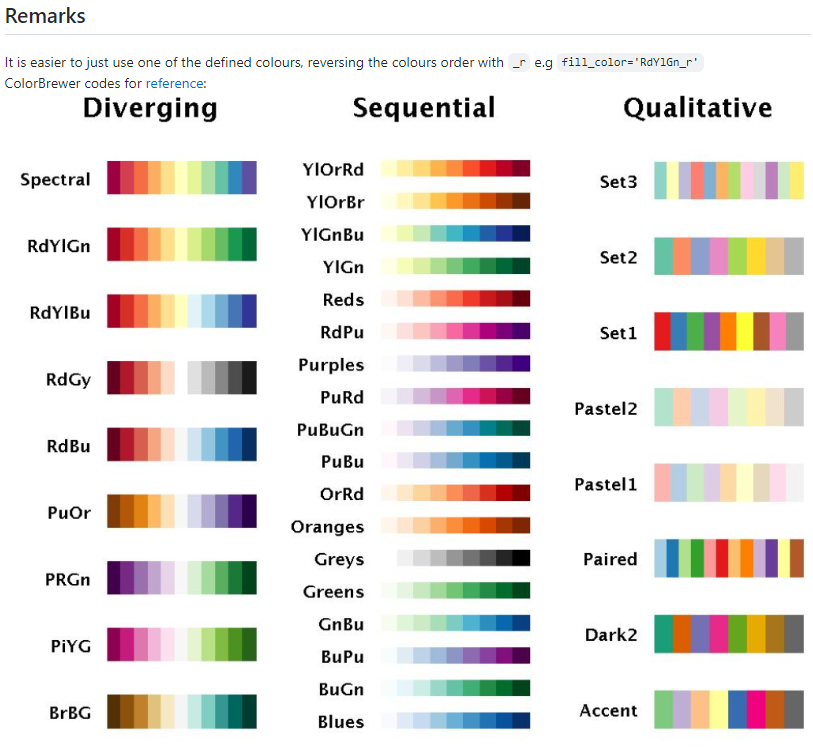

### 4- Surfaces brûlées en 2015 % comté pour feux < 3 acres - Préparation des données

In [22]:
counties_geo = r'../maps/geojson-counties-fips.json'

In [23]:
from json import loads

In [24]:
with open(counties_geo, encoding = "utf8") as f:
    counties_data = f.readlines()
    counties_data = [loads(line) for line in counties_data]
counties_data = counties_data[0]

In [25]:
[key for key in counties_data]

['type', 'features']

In [26]:
[key for key in counties_data['features'][0]]

['type', 'properties', 'geometry', 'id']

In [27]:
[key for key in counties_data['features'][0]['properties']]

['GEO_ID', 'STATE', 'COUNTY', 'NAME', 'LSAD', 'CENSUSAREA']

In [28]:
len(counties_data['features'])

3221

In [29]:
count_ID = []
for i in range(len(counties_data['features'])):
    if counties_data['features'][i]['properties']['COUNTY'] not in count_ID:
        count_ID.append(counties_data['features'][i]['properties']['COUNTY'])
count_ID

['001',
 '009',
 '017',
 '021',
 '033',
 '045',
 '051',
 '065',
 '079',
 '083',
 '099',
 '107',
 '121',
 '050',
 '105',
 '122',
 '150',
 '164',
 '180',
 '188',
 '198',
 '141',
 '145',
 '005',
 '043',
 '055',
 '089',
 '115',
 '003',
 '013',
 '014',
 '025',
 '031',
 '035',
 '047',
 '087',
 '095',
 '111',
 '119',
 '125',
 '029',
 '059',
 '071',
 '091',
 '113',
 '123',
 '053',
 '057',
 '073',
 '015',
 '023',
 '039',
 '261',
 '270',
 '019',
 '061',
 '085',
 '097',
 '101',
 '129',
 '309',
 '313',
 '319',
 '067',
 '081',
 '049',
 '069',
 '131',
 '139',
 '153',
 '173',
 '179',
 '183',
 '077',
 '103',
 '155',
 '169',
 '175',
 '189',
 '203',
 '011',
 '157',
 '187',
 '197',
 '201',
 '217',
 '225',
 '233',
 '243',
 '253',
 '265',
 '277',
 '285',
 '293',
 '303',
 '027',
 '075',
 '127',
 '135',
 '163',
 '185',
 '195',
 '205',
 '199',
 '209',
 '219',
 '229',
 '063',
 '137',
 '143',
 '151',
 '161',
 '181',
 '093',
 '147',
 '037',
 '041',
 '117',
 '133',
 '165',
 '109',
 '159',
 '211',
 '221',
 '171',


In [30]:
Fires_counties_2015 = df.query('FIRE_YEAR == 2015 & FIRE_SIZE <= 3').groupby(['FIPS_CODE','FIPS_NAME']).agg({'FIRE_SIZE':'sum'})
Fires_counties_2015.sample(5)

,,FIRE_SIZE
FIPS_CODE,FIPS_NAME,
57.0,Hubbard,13.95
3.0,Albemarle,22.10
117.0,Washington,26.16
83.0,Graves,5.80
17.0,Deschutes,34.03


In [31]:
Fires_counties_2015.reset_index(inplace = True)

In [32]:
Fires_counties_2015.FIPS_CODE = Fires_counties_2015.FIPS_CODE.astype('int')

In [33]:
Fires_counties_2015.sample(5)

,FIPS_CODE,FIPS_NAME,FIRE_SIZE
1505,123,Madison,14.25
1417,111,Monroe,5.50
249,15,Boone,0.10
423,25,Monmouth,13.25
1031,73,Gasconade,2.00


In [34]:
Fires_counties_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2035 entries, 0 to 2034
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   FIPS_CODE  2035 non-null   int32  
 1   FIPS_NAME  2035 non-null   object 
 2   FIRE_SIZE  2035 non-null   float64
dtypes: float64(1), int32(1), object(1)
memory usage: 39.9+ KB


In [35]:
Fires_counties_2015.FIRE_SIZE.describe()

count    2035.000000
mean       15.534519
std        23.012819
min         0.010000
25%         2.755000
50%         7.310000
75%        17.950000
max       269.950000
Name: FIRE_SIZE, dtype: float64

In [36]:
FIPS_CODE_dict = {}
for i in Fires_counties_2015.FIPS_CODE.unique():
    if len(str(i)) == 1:
        FIPS_CODE_dict[i] = '00' + str(i)
    elif len(str(i)) == 2:
        FIPS_CODE_dict[i] = '0' + str(i)
    else:
        FIPS_CODE_dict[i] = str(i)

FIPS_CODE_dict

{1: '001',
 3: '003',
 5: '005',
 6: '006',
 7: '007',
 9: '009',
 11: '011',
 12: '012',
 13: '013',
 15: '015',
 17: '017',
 19: '019',
 21: '021',
 23: '023',
 25: '025',
 27: '027',
 28: '028',
 29: '029',
 31: '031',
 33: '033',
 35: '035',
 36: '036',
 37: '037',
 39: '039',
 41: '041',
 43: '043',
 45: '045',
 47: '047',
 49: '049',
 50: '050',
 51: '051',
 53: '053',
 55: '055',
 57: '057',
 59: '059',
 61: '061',
 63: '063',
 65: '065',
 67: '067',
 69: '069',
 71: '071',
 73: '073',
 75: '075',
 77: '077',
 78: '078',
 79: '079',
 81: '081',
 83: '083',
 85: '085',
 86: '086',
 87: '087',
 89: '089',
 91: '091',
 93: '093',
 95: '095',
 97: '097',
 99: '099',
 101: '101',
 103: '103',
 105: '105',
 107: '107',
 109: '109',
 110: '110',
 111: '111',
 113: '113',
 115: '115',
 117: '117',
 119: '119',
 121: '121',
 122: '122',
 123: '123',
 125: '125',
 127: '127',
 129: '129',
 130: '130',
 131: '131',
 133: '133',
 135: '135',
 137: '137',
 139: '139',
 141: '141',
 143: '143

In [37]:
Fires_counties_2015.FIPS_CODE.replace(FIPS_CODE_dict, inplace = True)

In [38]:
m = folium.Map(location=[40, -95], zoom_start=4)

folium.Choropleth(
    geo_data=counties_geo,
    name="choropleth",
    data=Fires_counties_2015,
    columns=['FIPS_CODE', 'FIRE_SIZE'],
    key_on="feature.properties.COUNTY",
    fill_color='Paired',
    bins=11,
    #fill_color='YlOrRd',
    nan_fill_color='white',
    fill_opacity=0.7,
    line_opacity=.1,
    highlight=True,
    legend_name="Surface annulée brûlée en 2015 par les petits feux (moins de 3 acres)",
).add_to(m)

folium.LayerControl().add_to(m)

m

In [39]:
Fires_counties_2015_Filtered = Fires_counties_2015.query('FIRE_SIZE < 18')

In [40]:
m = folium.Map(location=[40, -95], zoom_start=4)

folium.Choropleth(
    geo_data=counties_geo,
    name="choropleth",
    data=Fires_counties_2015_Filtered,
    columns=['FIPS_CODE', 'FIRE_SIZE'],
    key_on="feature.properties.COUNTY",
    #fill_color='Paired',
    #bins=11,
    fill_color='YlOrRd',
    nan_fill_color='black',
    fill_opacity=0.7,
    line_opacity=.1,
    highlight=True,
    legend_name="Surface brûlée en 2015 par comté pour les petits feux (moins de 18 acres en cumulé par comté)",
).add_to(m)

folium.LayerControl().add_to(m)

m

In [41]:
usa_counties = gpd.read_file("../maps/cb_2020_us_county_20m.shp")
usa_counties.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
0,05,121,00069178,0500000US05121,05121,Randolph,Randolph County,AR,Arkansas,06,1688445990,10370823,"POLYGON ((-91.40492 36.49712, -91.12654 36.497..."
1,08,069,00198150,0500000US08069,08069,Larimer,Larimer County,CO,Colorado,06,6723014102,98984559,"POLYGON ((-106.19055 40.99775, -105.27714 40.9..."
2,26,105,01622995,0500000US26105,26105,Mason,Mason County,MI,Michigan,06,1281963206,1935616622,"POLYGON ((-86.51470 44.05812, -86.45807 44.099..."
3,28,153,00695797,0500000US28153,28153,Wayne,Wayne County,MS,Mississippi,06,2099745602,7255476,"POLYGON ((-88.94335 31.82456, -88.91046 31.826..."
4,38,075,01034229,0500000US38075,38075,Renville,Renville County,ND,North Dakota,06,2272050275,40658499,"POLYGON ((-102.02164 48.80711, -102.02122 48.9..."


In [43]:
usa_counties = usa_counties.merge(Fires_counties_2015_Filtered, left_on="COUNTYFP", right_on="FIPS_CODE")

In [44]:
Fires_counties_2015_Filtered.FIPS_CODE.nunique()

220

In [45]:
usa_counties.COUNTYFP.nunique()

218

In [ ]:
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

Interact = folium.features.GeoJson(
    usa_counties,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['FIPS_NAME', 'FIRE_SIZE'],
        aliases=['Comté : ', 'Surface brûlée (en acres) : '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)

m.add_child(Interact)
m.keep_in_front(Interact)
#folium.LayerControl().add_to(m)

m